## Installation requirements

Since the python libraries used in this course constantly release new updates, some of the code will inevitably become outdated. Therefore, in order for the code to run consistently on your computer, please make sure to have the following package versions installed:

* numpy==1.20.0 (for example, you can go to your command prompt and do **pip install numpy==1.20.0**)
* pandas==1.2.1
* matplotlib==3.3.4
* geopandas==0.8.1
* osmnx==1.0.0
* descartes==1.1.0
* shapely==1.7.1
* contextily==1.0rc2

In [1]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon, MultiPolygon

C:\Users\gevor\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
C:\Users\gevor\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True,

In [2]:
yerevan = gpd.read_file("Yerevan shapefile/Yerevan.shp")
yerevan.head()

,place_name,bbox_north,bbox_south,bbox_east,bbox_west,geometry
0,"Yerevan, Armenia",40.26241,40.0656851,44.6460194,44.4115546,"POLYGON ((449912.757 4449454.549, 450854.875 4..."


<AxesSubplot:>

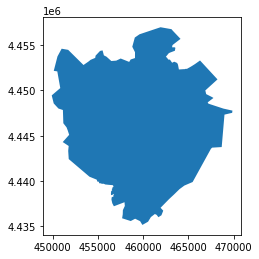

In [3]:
yerevan.plot()

In [4]:
yerevan.crs

<Projected CRS: EPSG:32638>
Name: WGS 84 / UTM zone 38N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 42°E and 48°E, northern hemisphere between equator and 84°N, onshore and offshore. Armenia. Azerbaijan. Djibouti. Eritrea. Ethiopia. Georgia. Islamic Republic of Iran. Iraq. kazakhstan. Kuwait. Russian Federation. Saudi Arabia. Somalia. Turkey. Yemen.
- bounds: (42.0, 0.0, 48.0, 84.0)
Coordinate Operation:
- name: UTM zone 38N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

epsg:4326
+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


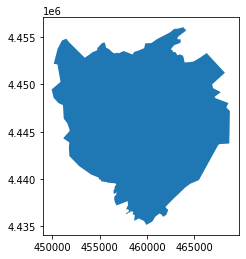

In [5]:
# load yerevan city from openstreetmap using osmmnx api
city = ox.geocode_to_gdf("Yerevan, Armenia")
print(city.crs)
city = ox.projection.project_gdf(city)
ax = city.plot(ec='none')
#_ = ax.axis('off')
print(city.crs)

In [6]:
# city.to_file('Desktop/Yerevan_city.shp')

In [7]:
geometry = city['geometry'].iloc[0]
print(type(geometry))

<class 'shapely.geometry.polygon.Polygon'>


In [8]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 750)
print(type(geometry_cut))

<class 'shapely.geometry.multipolygon.MultiPolygon'>


### WARNING!

The osmnx function we use to divide the polygon into a grid will split the city into a different number of grid cells compared to what you will see in the video lectures!

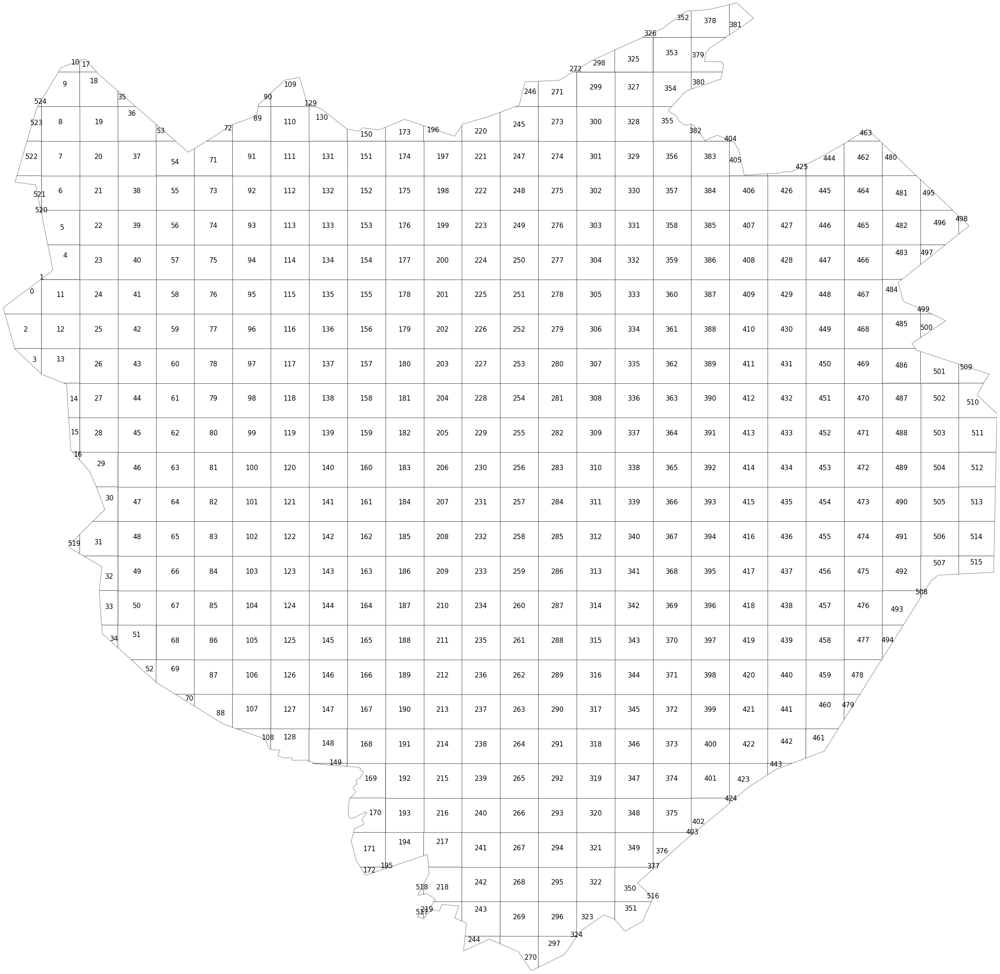

In [9]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [10]:
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((449912.757 4449454.549, 450626.235 4..."
1,"POLYGON ((450626.235 4450065.522, 450636.949 4..."
2,"POLYGON ((450636.949 4449319.919, 450636.949 4..."
3,"POLYGON ((450636.949 4448574.317, 450636.949 4..."
4,"POLYGON ((450636.949 4450074.697, 450854.875 4..."


In [11]:
len(polyframe)

525

(4875492.0553135285, 4902914.137966398)

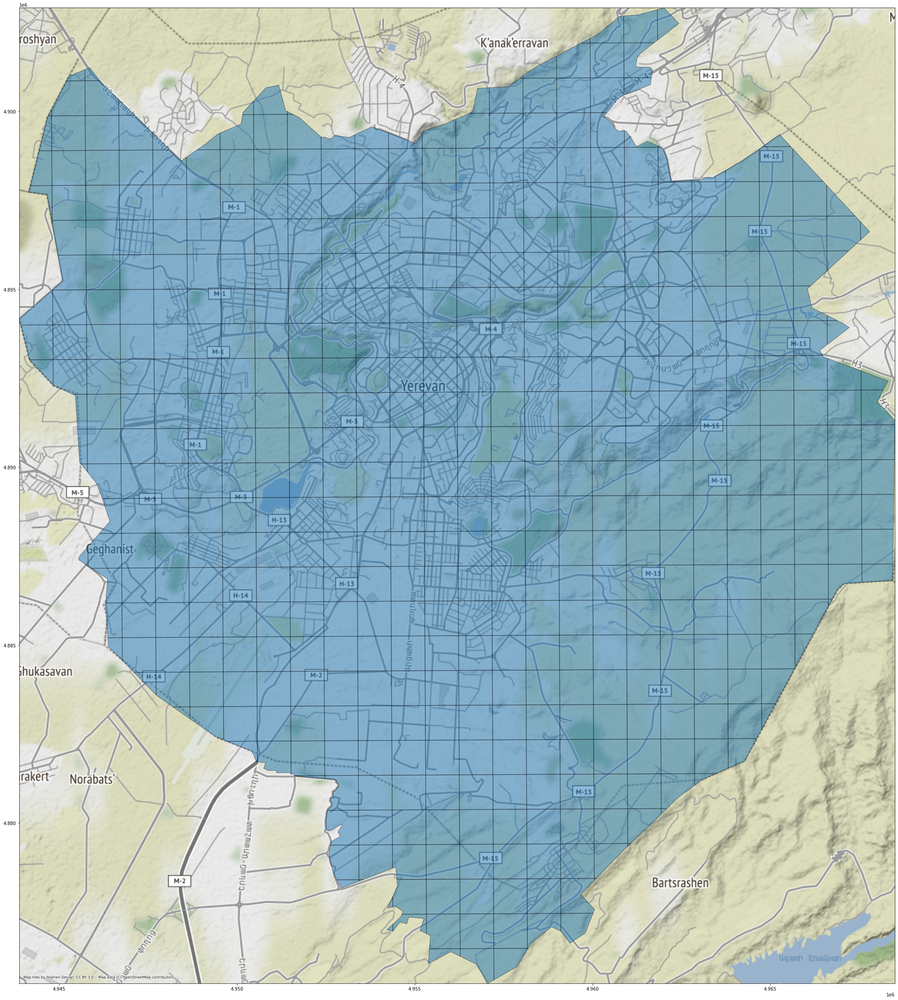

In [12]:
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

In [13]:
l = len(polylist)
OD_matrix = np.zeros(shape=(l,l))
print(OD_matrix)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


### Exercise!

Plot the grid cells annotated with their ID numbers with a map background using contextily!

(Try it yourself to test what you've learnt. If you fail or are too lazy for that, the solution is provided at the end of this notebook :) )

In [14]:
import pickle
pkl_file = open("Materials/Yerevan_grid_population.pkl", "rb")
yerevan_pop = pickle.load(pkl_file)
pkl_file.close()
print(yerevan_pop)

[    0.             0.             0.             0.
     0.             0.             0.             0.
   727.53728629     0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.          3839.78012206
     0.             0.             0.             0.
     0.             0.             0.             0.
  2020.93690635     0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.          1050.8871913
     0.             0.             0.             0.
     0.             0.         

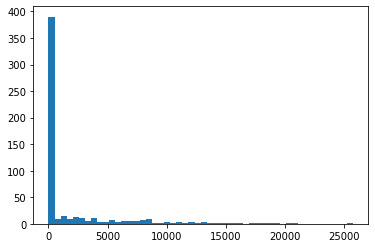

In [15]:
plt.hist(yerevan_pop, bins=50)
plt.show()

In [16]:
yerevan_gdf = gpd.read_file('Yerevan grid shapefile/yerevan.shp')
yerevan_gdf.head()

,FID,geometry
0,0,"POLYGON ((44.41298 40.18969, 44.41155 40.19399..."
1,1,"POLYGON ((44.41772 40.18316, 44.41418 40.18603..."
2,2,"POLYGON ((44.42035 40.18107, 44.42025 40.18110..."
3,3,"POLYGON ((44.42598 40.17664, 44.42576 40.17920..."
4,4,"POLYGON ((44.42652 40.17009, 44.42598 40.17664..."


In [17]:
print('yerevan geodataframe length: ', len(yerevan_gdf))
print('Yerevan population array length: ', len(yerevan_pop))

yerevan geodataframe length:  549
Yerevan population array length:  549


In [18]:
yerevan_gdf['population'] = yerevan_pop
yerevan_gdf.head()

,FID,geometry,population
0,0,"POLYGON ((44.41298 40.18969, 44.41155 40.19399...",0.0
1,1,"POLYGON ((44.41772 40.18316, 44.41418 40.18603...",0.0
2,2,"POLYGON ((44.42035 40.18107, 44.42025 40.18110...",0.0
3,3,"POLYGON ((44.42598 40.17664, 44.42576 40.17920...",0.0
4,4,"POLYGON ((44.42652 40.17009, 44.42598 40.17664...",0.0


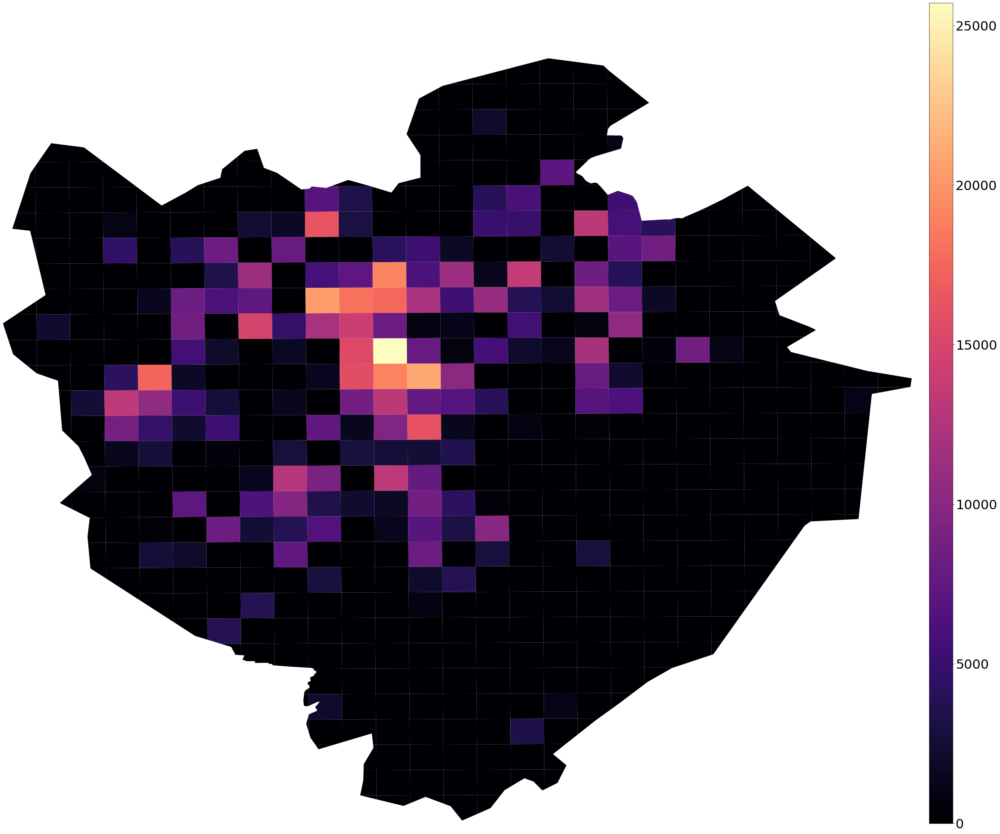

In [19]:
plt.rcParams.update({'font.size':32})
west, south, east, north = yerevan_gdf.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
yerevan_gdf.plot(ax=ax, column = 'population', legend=False, cmap='magma')

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(yerevan_gdf.population), vmax=max(yerevan_gdf.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

### Solution to exercise:

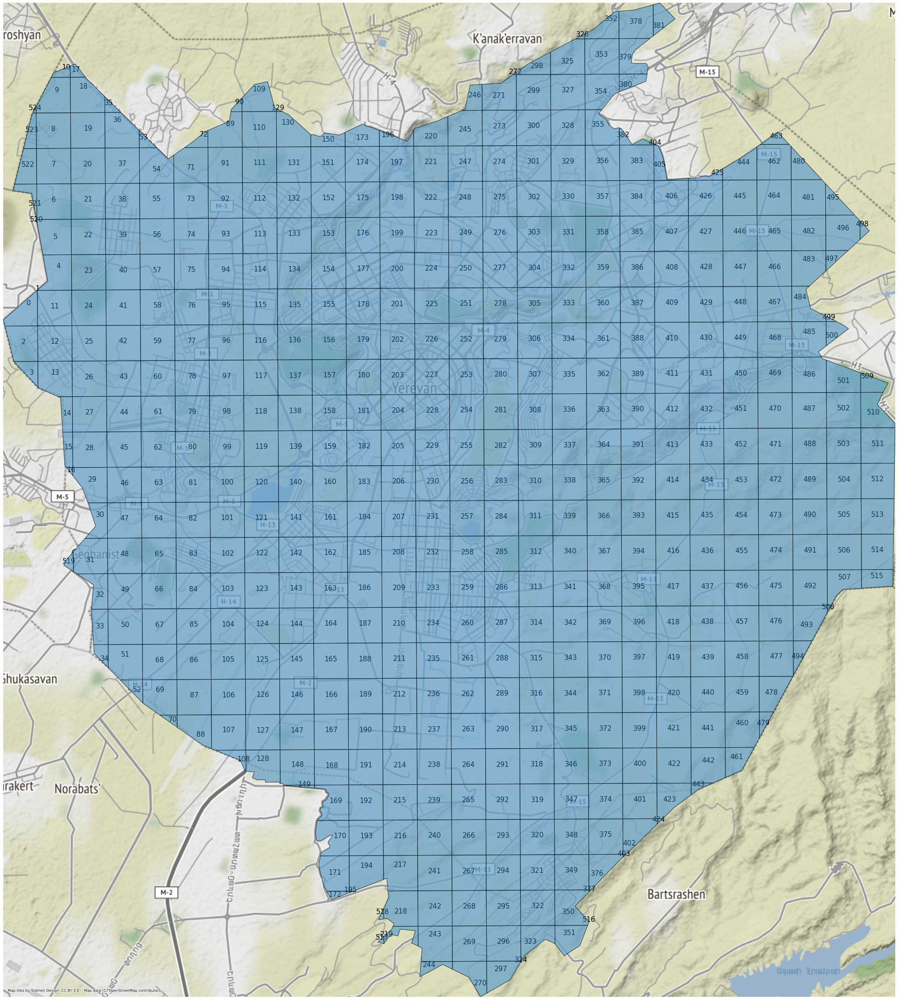

In [20]:
polylist = [p for p in polyframe_3857.geometry]

# plot city
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k', zorder=5)
for polygon, n in zip(polylist, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
ctx.add_basemap(ax, zoom=13)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()